# TED Talks Exploratory Data Analysis

## Import data and libraries

In [1]:
#import libraries
import numpy as np
import pandas as pd
from ast import literal_eval
from datetime import datetime
from pprint import pprint

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

import warnings
warnings.simplefilter('ignore')

In [2]:
#read in summarized ted talk data
ted_main_df = pd.read_csv('data/ted_main.csv')

#### What does the basic TED Talk dataset look like?

In [3]:
pd.set_option('display.max_columns', None)
ted_main_df.head()

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,tags,title,url,views
0,4553,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,1140825600,60,Ken Robinson,Ken Robinson: Do schools kill creativity?,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 19645}, {...","[{'id': 865, 'hero': 'https://pe.tedcdn.com/im...",Author/educator,"['children', 'creativity', 'culture', 'dance',...",Do schools kill creativity?,https://www.ted.com/talks/ken_robinson_says_sc...,47227110
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,"['alternative energy', 'cars', 'climate change...",Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520
2,124,New York Times columnist David Pogue takes aim...,1286,TED2006,1140739200,26,David Pogue,David Pogue: Simplicity sells,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 964}, {'i...","[{'id': 1725, 'hero': 'https://pe.tedcdn.com/i...",Technology columnist,"['computers', 'entertainment', 'interface desi...",Simplicity sells,https://www.ted.com/talks/david_pogue_says_sim...,1636292
3,200,"In an emotionally charged talk, MacArthur-winn...",1116,TED2006,1140912000,35,Majora Carter,Majora Carter: Greening the ghetto,1,1151367060,"[{'id': 3, 'name': 'Courageous', 'count': 760}...","[{'id': 1041, 'hero': 'https://pe.tedcdn.com/i...",Activist for environmental justice,"['MacArthur grant', 'activism', 'business', 'c...",Greening the ghetto,https://www.ted.com/talks/majora_carter_s_tale...,1697550
4,593,You've never seen data presented like this. Wi...,1190,TED2006,1140566400,48,Hans Rosling,Hans Rosling: The best stats you've ever seen,1,1151440680,"[{'id': 9, 'name': 'Ingenious', 'count': 3202}...","[{'id': 2056, 'hero': 'https://pe.tedcdn.com/i...",Global health expert; data visionary,"['Africa', 'Asia', 'Google', 'demo', 'economic...",The best stats you've ever seen,https://www.ted.com/talks/hans_rosling_shows_t...,12005869


The columns in my dataset are:
- **Comments**: number of comments posted by people watching the talk online
- **Description**: short description of the talk's content
- **Duration**: length of the talk in seconds
- **Event**: name of the TED event where the talk was given/recorded
- **Film_date**: UNIX timestamp of when the talk was given/recorded
- **Languages**: number of languages the talk has been translated into
- **Main_speaker**: name of the primary speaker for the talk
- **Name**: combination of the talk's main speaker and the title
- **Num_speaker**: total number of speakers involved in the talk
- **Published_date**: UNIX timestamp when the talk recording was published online
- **Ratings**: list of dictionaries containing ratings categories and the number of votes the talk received for each category
- **Related_talks**: list of dictionaries containing URLs of talks with similar content
- **Speaker_occupation**: what the speaker(s) do for a living
- **Tags**: short list of keywords describing the talk content
- **Title**: talk title
- **URL**: link where the talk is published
- **Views**: how many times the published talk has been viewed

In [4]:
ted_main_df.describe()

,comments,duration,film_date,languages,num_speaker,published_date,views
count,2550.000000,2550.000000,2.550000e+03,2550.000000,2550.000000,2.550000e+03,2.550000e+03
mean,191.562353,826.510196,1.321928e+09,27.326275,1.028235,1.343525e+09,1.698297e+06
std,282.315223,374.009138,1.197391e+08,9.563452,0.207705,9.464009e+07,2.498479e+06
min,2.000000,135.000000,7.464960e+07,0.000000,1.000000,1.151367e+09,5.044300e+04
25%,63.000000,577.000000,1.257466e+09,23.000000,1.000000,1.268463e+09,7.557928e+05
50%,118.000000,848.000000,1.333238e+09,28.000000,1.000000,1.340935e+09,1.124524e+06
75%,221.750000,1046.750000,1.412964e+09,33.000000,1.000000,1.423432e+09,1.700760e+06
max,6404.000000,5256.000000,1.503792e+09,72.000000,5.000000,1.506092e+09,4.722711e+07


### Notes:

**Comments**
- There is a lot of variation in the number of comments. 75% of talks have fewer than 222 comments, but the range is 2-6404 and the standard deviation is more than 280.
- The amount of time since a talk has been published may skew the number of comments posted towards older talks.

**Duration**
- The shortest talk is only 2 minutes long, but most are about 10-15 minutes. The longest "talk" is almost 1.5 hours long.

**Languages**
- The minimum is 0 languages. These bear closer scrutiny since a "talk" should be available in at least 1 language.

**Num_speaker**
- The vast majority of talks have only one speaker. This feature doesn't appear to have much variability.

**Views**
- There are three orders of magnitude between the min (50,443) and the max (47,227,110). 


In [5]:
ted_main_df[ted_main_df['languages'] == 0]

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,tags,title,url,views
58,222,"Two Pilobolus dancers perform ""Symbiosis."" Doe...",825,TED2005,1109289600,0,Pilobolus,"Pilobolus: A dance of ""Symbiosis""",1,1170979860,"[{'id': 1, 'name': 'Beautiful', 'count': 1810}...","[{'id': 40, 'hero': 'https://pe.tedcdn.com/ima...",Dance company,"['dance', 'entertainment', 'nature', 'performa...","A dance of ""Symbiosis""",https://www.ted.com/talks/pilobolus_perform_sy...,3051507
115,27,The avant-garde string quartet Ethel performs ...,214,TED2006,1138838400,0,Ethel,"Ethel: A string quartet plays ""Blue Room""",1,1182184140,"[{'id': 1, 'name': 'Beautiful', 'count': 216},...","[{'id': 103, 'hero': 'https://pe.tedcdn.com/im...",String quartet,"['cello', 'collaboration', 'culture', 'enterta...","A string quartet plays ""Blue Room""",https://www.ted.com/talks/ethel_performs_blue_...,384641
135,36,After Vusi Mahlasela's 3-song set at TEDGlobal...,299,TEDGlobal 2007,1181260800,0,Vusi Mahlasela,"Vusi Mahlasela: ""Woza""",1,1187695440,"[{'id': 8, 'name': 'Informative', 'count': 4},...","[{'id': 158, 'hero': 'https://pe.tedcdn.com/im...","Musician, activist","['Africa', 'entertainment', 'guitar', 'live mu...","""Woza""",https://www.ted.com/talks/vusi_mahlasela_s_enc...,416603
209,67,"Rokia Traore sings the moving ""M'Bifo,"" accomp...",419,TEDGlobal 2007,1181088000,0,Rokia Traore,"Rokia Traore: ""M'Bifo""",1,1206580680,"[{'id': 23, 'name': 'Jaw-dropping', 'count': 5...","[{'id': 265, 'hero': 'https://pe.tedcdn.com/im...",Singer-songwriter,"['Africa', 'entertainment', 'guitar', 'live mu...","""M'Bifo""",https://www.ted.com/talks/rokia_traore_sings_m...,294936
237,43,"Singer-songwriter Rokia Traore performs ""Kouna...",386,TEDGlobal 2007,1181088000,0,Rokia Traore,"Rokia Traore: ""Kounandi""",1,1212627600,"[{'id': 22, 'name': 'Fascinating', 'count': 84...","[{'id': 186, 'hero': 'https://pe.tedcdn.com/im...",Singer-songwriter,"['Africa', 'guitar', 'live music', 'music', 's...","""Kounandi""",https://www.ted.com/talks/rokia_traore_sings_k...,82488
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1427,229,"Kid President commands you to wake up, listen ...",208,SoulPancake,1358985600,0,Kid President,Kid President: I think we all need a pep talk,1,1359734822,"[{'id': 10, 'name': 'Inspiring', 'count': 771}...","[{'id': 815, 'hero': 'https://pe.tedcdn.com/im...",Inspirer,"['children', 'comedy', 'humor']",I think we all need a pep talk,https://www.ted.com/talks/kid_president_i_thin...,828203
1467,183,"As we move through the world, we have an innat...",388,TEDYouth 2012,1353110400,0,Katherine Kuchenbecker,Katherine Kuchenbecker: The technology of touch,1,1364569190,"[{'id': 9, 'name': 'Ingenious', 'count': 150},...","[{'id': 1692, 'hero': 'https://pe.tedcdn.com/i...",Mechanical engineer,"['TEDYouth', 'engineering', 'technology']",The technology of touch,https://www.ted.com/talks/katherine_kuchenbeck...,274986
1486,126,What color is a mirror? How much does a video ...,441,TED-Ed,1362009600,0,Michael Stevens,Michael Stevens: How much does a video weigh?,1,1366815569,"[{'id': 22, 'name': 'Fascinating', 'count': 17...","[{'id': 1386, 'hero': 'https://pe.tedcdn.com/i...",YouTube educator,"['Internet', 'TED-Ed', 'computers', 'humor', '...",How much does a video weigh?,https://www.ted.com/talks/how_much_does_a_vide...,195899
2407,5,Grammy-winning Silk Road Ensemble display thei...,389,TED2016,1455494400,0,Silk Road Ensemble,"Silk Road Ensemble: ""Turceasca""",1,1489759215,"[{'id': 1, 'name': 'Beautiful', 'count': 80}, ...","[{'id': 2611, 'hero': 'https://pe.tedcdn.com/i...",Musical explorers,"['art', 'live music', 'music', 'performance']","""Turceasca""",https://www.ted.com/talks/silk_road_ensemble_t...,640734


There are 86 records with 0 languages.
It looks like many of these are music or dance performances, which would explain how they have 0 spoken languages.
But some are still suspect, like "Kid President: I think we all need a pep talk". 

If languages is a feature we want to use in a model, these may need additional cleaning.

#### Are any other columns missing values?

In [6]:
ted_main_df.isnull().any()

comments              False
description           False
duration              False
event                 False
film_date             False
languages             False
main_speaker          False
name                  False
num_speaker           False
published_date        False
ratings               False
related_talks         False
speaker_occupation     True
tags                  False
title                 False
url                   False
views                 False
dtype: bool

In [7]:
ted_main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2550 entries, 0 to 2549
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   comments            2550 non-null   int64 
 1   description         2550 non-null   object
 2   duration            2550 non-null   int64 
 3   event               2550 non-null   object
 4   film_date           2550 non-null   int64 
 5   languages           2550 non-null   int64 
 6   main_speaker        2550 non-null   object
 7   name                2550 non-null   object
 8   num_speaker         2550 non-null   int64 
 9   published_date      2550 non-null   int64 
 10  ratings             2550 non-null   object
 11  related_talks       2550 non-null   object
 12  speaker_occupation  2544 non-null   object
 13  tags                2550 non-null   object
 14  title               2550 non-null   object
 15  url                 2550 non-null   object
 16  views               2550

Yes, there appear to be 6 missing values in the speaker_occupation column. We'll look at these a little later.

## Clean and transform columns

#### Turn UNIX dates into datetime values.

I'm also keeping the original numeric dates for exploring correlations later.

In [8]:
ted_main_df['film_datestamp'] = ted_main_df['film_date'].apply(datetime.fromtimestamp)
ted_main_df['published_datestamp'] = ted_main_df['published_date'].apply(datetime.fromtimestamp)
ted_main_df[['film_datestamp','published_datestamp']]

,film_datestamp,published_datestamp
0,2006-02-24 18:00:00,2006-06-26 19:11:00
1,2006-02-24 18:00:00,2006-06-26 19:11:00
2,2006-02-23 18:00:00,2006-06-26 19:11:00
3,2006-02-25 18:00:00,2006-06-26 19:11:00
4,2006-02-21 18:00:00,2006-06-27 15:38:00
...,...,...
2545,2017-06-05 19:00:00,2017-09-19 15:00:16
2546,2017-04-23 19:00:00,2017-09-20 10:02:17
2547,2017-04-23 19:00:00,2017-09-21 10:01:35
2548,2017-07-07 19:00:00,2017-09-21 15:00:42


#### Fill missing values

Let's look again at the missing speaker occupations.

In [9]:
ted_main_df[ted_main_df['speaker_occupation'].isnull()]

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,tags,title,url,views,film_datestamp,published_datestamp
1113,145,"After a crisis, how can we tell if water is sa...",217,TEDGlobal 2011,1310601600,38,Sonaar Luthra,Sonaar Luthra: Meet the Water Canary,1,1326731605,"[{'id': 10, 'name': 'Inspiring', 'count': 73},...","[{'id': 523, 'hero': 'https://pe.tedcdn.com/im...",NaN,"['TED Fellows', 'design', 'global development'...",Meet the Water Canary,https://www.ted.com/talks/sonaar_luthra_meet_t...,353749,2011-07-13 19:00:00,2012-01-16 10:33:25
1192,122,"The Pirate Party fights for transparency, anon...",1097,TEDxObserver,1331424000,10,Rick Falkvinge,Rick Falkvinge: I am a pirate,1,1333289675,"[{'id': 8, 'name': 'Informative', 'count': 156...","[{'id': 1329, 'hero': 'https://pe.tedcdn.com/i...",NaN,"['Internet', 'TEDx', 'global issues', 'politic...",I am a pirate,https://www.ted.com/talks/rick_falkvinge_i_am_...,181010,2012-03-10 18:00:00,2012-04-01 09:14:35
1220,257,"As you surf the Web, information is being coll...",399,TED2012,1330473600,32,Gary Kovacs,Gary Kovacs: Tracking our online trackers,1,1336057219,"[{'id': 23, 'name': 'Jaw-dropping', 'count': 9...","[{'id': 1370, 'hero': 'https://pe.tedcdn.com/i...",NaN,"['Internet', 'advertising', 'business', 'priva...",Tracking our online trackers,https://www.ted.com/talks/gary_kovacs_tracking...,2098639,2012-02-28 18:00:00,2012-05-03 10:00:19
1656,140,"In this lovely talk, TED Fellow Ryan Holladay ...",389,TED@BCG San Francisco,1383091200,33,Ryan Holladay,Ryan Holladay: To hear this music you have to ...,1,1389369735,"[{'id': 1, 'name': 'Beautiful', 'count': 211},...","[{'id': 1152, 'hero': 'https://pe.tedcdn.com/i...",NaN,"['TED Fellows', 'entertainment', 'music', 'tec...",To hear this music you have to be there. Liter...,https://www.ted.com/talks/ryan_holladay_to_hea...,1284510,2013-10-29 19:00:00,2014-01-10 10:02:15
1911,48,What do you do with an outdated encyclopedia i...,366,TEDYouth 2014,1415059200,34,Brian Dettmer,Brian Dettmer: Old books reborn as art,1,1423238442,"[{'id': 1, 'name': 'Beautiful', 'count': 361},...","[{'id': 610, 'hero': 'https://pe.tedcdn.com/im...",NaN,"['TEDYouth', 'art', 'books', 'creativity']",Old books reborn as art,https://www.ted.com/talks/brian_dettmer_old_bo...,1159937,2014-11-03 18:00:00,2015-02-06 10:00:42
1949,70,Photographer Boniface Mwangi wanted to protest...,440,TEDGlobal 2014,1413763200,33,Boniface Mwangi,Boniface Mwangi: The day I stood up alone,1,1427989423,"[{'id': 3, 'name': 'Courageous', 'count': 614}...","[{'id': 1757, 'hero': 'https://pe.tedcdn.com/i...",NaN,"['TED Fellows', 'activism', 'art', 'corruption...",The day I stood up alone,https://www.ted.com/talks/boniface_mwangi_boni...,1342431,2014-10-19 19:00:00,2015-04-02 10:43:43


It's possible I could Google these speakers and find out their occupations, but for now I will just fill with "Unknown".

In [10]:
ted_main_df['speaker_occupation'].fillna('Unknown', inplace = True)

#### Process embedded data types

Some of the fields in the dataset had other data types embedded in them, like lists and dictionaries, but they were read in as strings. Here we will convert them to their Python data types.

In [11]:
ted_main_df['tags'] = ted_main_df['tags'].apply(literal_eval)
ted_main_df['tags'][0] #show sample

['children',
 'creativity',
 'culture',
 'dance',
 'education',
 'parenting',
 'teaching']

In [12]:
ted_main_df['ratings'] = ted_main_df['ratings'].apply(literal_eval)
rating_df = pd.DataFrame(ted_main_df['ratings'][0]) #show sample
rating_df.head()

,id,name,count
0,7,Funny,19645
1,1,Beautiful,4573
2,9,Ingenious,6073
3,3,Courageous,3253
4,11,Longwinded,387


## Explore correlations between features

In [13]:
ted_main_df.corr()

,comments,duration,film_date,languages,num_speaker,published_date,views
comments,1.000000,0.140694,-0.133303,0.318284,-0.035489,-0.185936,0.530939
duration,0.140694,1.000000,-0.242941,-0.295681,0.022257,-0.166324,0.048740
film_date,-0.133303,-0.242941,1.000000,-0.061957,0.040227,0.902565,0.006447
languages,0.318284,-0.295681,-0.061957,1.000000,-0.063100,-0.171836,0.377623
num_speaker,-0.035489,0.022257,0.040227,-0.063100,1.000000,0.049240,-0.026389
published_date,-0.185936,-0.166324,0.902565,-0.171836,0.049240,1.000000,-0.017920
views,0.530939,0.048740,0.006447,0.377623,-0.026389,-0.017920,1.000000


<AxesSubplot:>

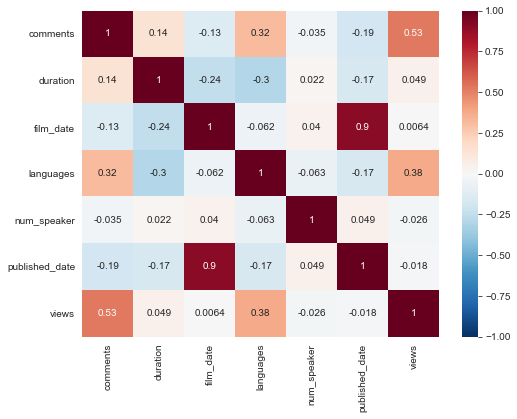

In [14]:
plt.figure(figsize = (8,6))
sns.heatmap(data = ted_main_df.corr(), annot = True, cmap = 'RdBu_r', vmin = -1, vmax = 1)

Correlation notes:

- **Comments**
    - Minor positive correlation with **duration** (the longer a talk, the more likely it is to be commented on)
    - Minor negative correlation with **film date** (older talks have more comments, possibly because they've been available for commenting longer?)
    - Medium correlation with **languages** (talks with more comments are available in more languages)
    - Slight negative correlation with **published date** (see comments on correlation with film date)
    - Reasonably strong correlation with **views** (talks with more comments have been viewed more times)  
   
   
- **Duration**
    - Slight negative correlation with **film date** (talks have gotten shorter over time)
    - Slight negative correlation with **languages** (longer talks are available in fewer languages)
    - Minor negative correlation with **published date** (talks published more recently are a little shorter)  
   
   
- **Film Date**
    - Strong positive correlation with **published date** (talks are published around the same time they are filmed)   
   
   
- **Languages**
    - Minor negative correlation with **published date** (talks published more recently are available in fewer languages, possibly because there's been less time to translate them)
    - Medium correlation with **views** (talks available in more languages have more views)   
   
   
- **Num Speaker** - no meaningful correlations

## View feature distributions

['comments', 'duration', 'film_datestamp', 'languages', 'num_speaker', 'published_datestamp', 'views']


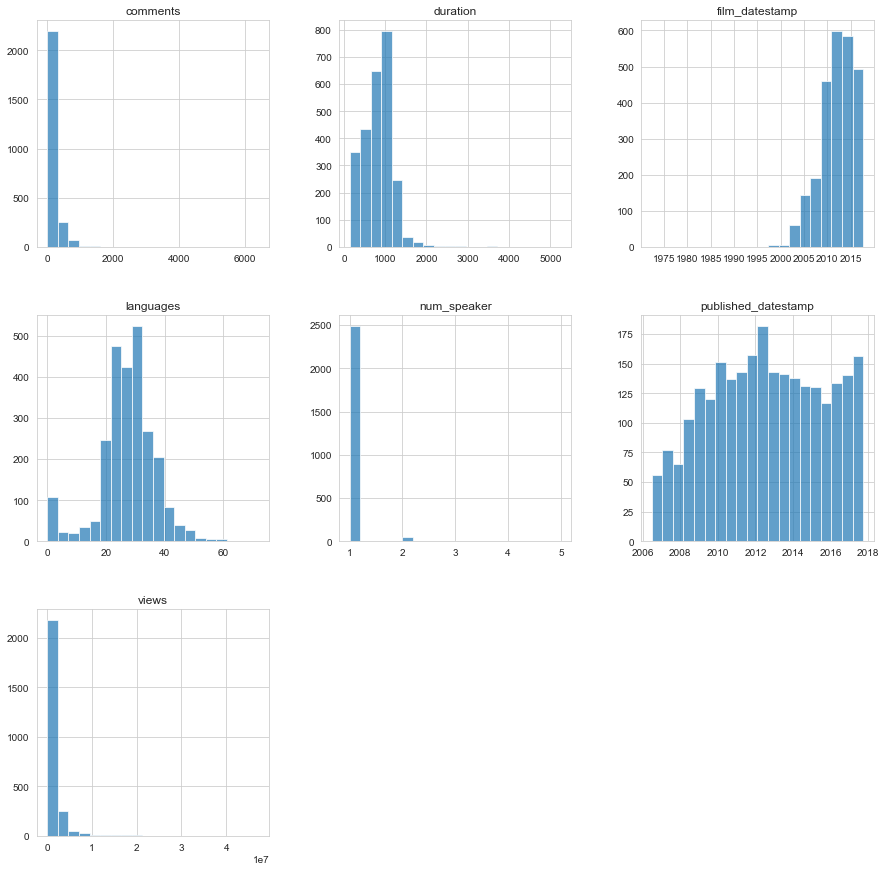

In [15]:
feature_list = ['comments','duration','film_datestamp','languages','num_speaker','published_datestamp','views']
fig = plt.figure(figsize = (15,15))
ax = fig.gca()
ted_main_df[feature_list].hist(ax = ax, bins = 20, alpha = 0.7)
print(feature_list)

Many of the distributions appear skewed. 

Languages seems roughly normal except for the bump at 0.

Published date looks more uniform than others.

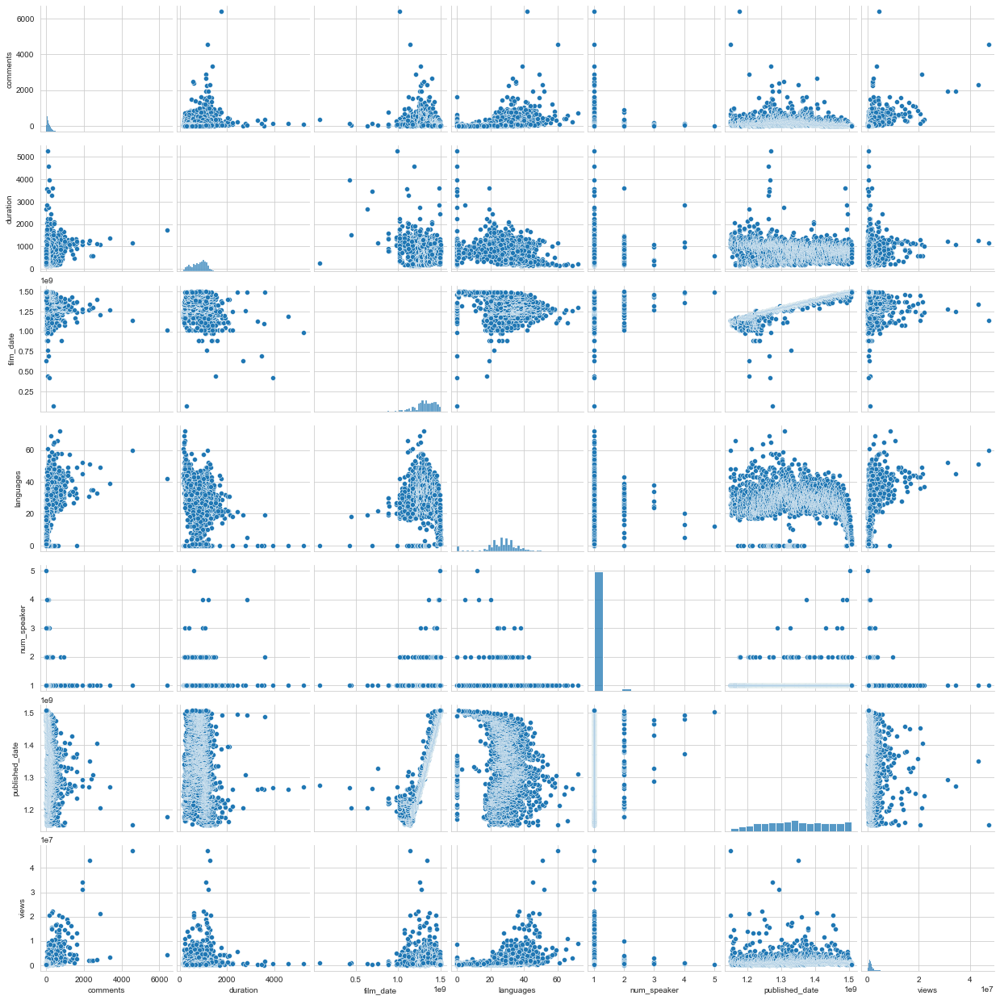

In [16]:
sns.pairplot(ted_main_df)

## Explore data

#### TED Talks by Year

<AxesSubplot:>

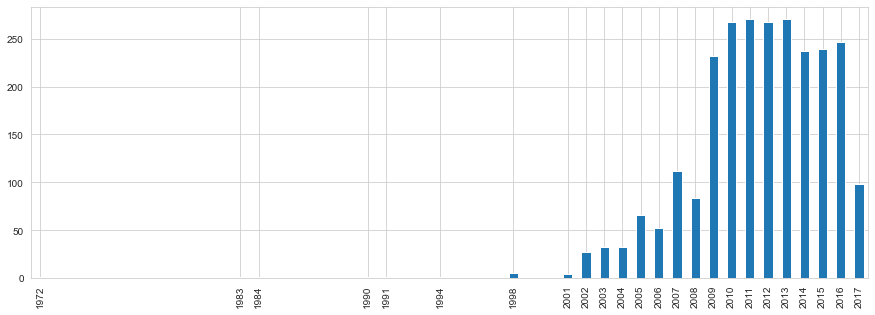

In [17]:
ted_main_df['film_datestamp'].dt.year.value_counts().sort_index()
ted_main_df['film_datestamp'].dt.year.value_counts().plot(kind = 'bar', figsize = (15,5))

Although the earliest talks in the dataset date back to 1972, they weren't recorded on a regular basis until around 2002.
There's a big jump in 2009, more than doubling the typical number of talks per year.
It looks like 2017 may not include the complete year.

In [18]:
ted_main_df['film_datestamp'].max()

Timestamp('2017-08-26 19:00:00')

The 2017 data only goes through late August.

#### Count of TED Talks by Event

In [19]:
ted_main_df['event'].nunique()

355

There are 355 unique TED events in the dataset.

<AxesSubplot:>

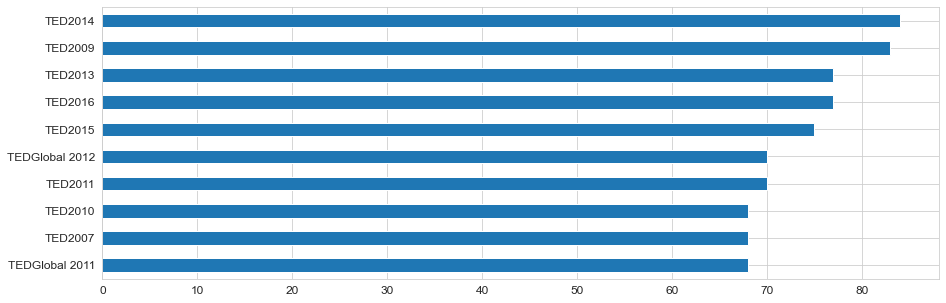

In [20]:
ted_main_df['event'].value_counts()[:10].sort_values(ascending = True).plot(kind = 'barh', figsize = (15,5), fontsize = 12)

TED2014 and TED2009 have more published talks than any of the other events, with more than 80 each.

Most talks have only one speaker. What are some of the talks with more than one speaker?

In [21]:
ted_main_df[ted_main_df['num_speaker'] > 1][['num_speaker','description','name','title','speaker_occupation','tags']][:15]

,num_speaker,description,name,title,speaker_occupation,tags
93,2,"Singer/songwriter Eddi Reader performs ""Kitefl...","Eddi Reader: ""Kiteflyer's Hill""","""Kiteflyer's Hill""",Singer/songwriter,"[composing, entertainment, guitar, memory, mus..."
94,2,"Singer/songwriter Eddi Reader performs ""What Y...","Eddi Reader: ""What You've Got""","""What You've Got""",Singer/songwriter,"[composing, entertainment, guitar, music, perf..."
98,2,Featuring the vocals and mischievous bell-play...,"Rachelle Garniez: ""La Vie en Rose""","""La Vie en Rose""",Musician,"[entertainment, live music, music, performance]"
100,2,Violinist Natalie MacMaster and TED Musical Di...,Natalie MacMaster: Cape Breton fiddling in ree...,Cape Breton fiddling in reel time,Fiddler,"[entertainment, history, live music, music, pe..."
101,2,Google co-founders Larry Page and Sergey Brin ...,Sergey Brin + Larry Page: The genesis of Google,The genesis of Google,"Computer scientist, entrepreneur and philanthr...","[Google, TED Brain Trust, business, collaborat..."
193,2,"Two TED favorites, Jill Sobule and Julia Sween...",Jill Sobule + Julia Sweeney: The Jill and Juli...,The Jill and Julia Show,Singer/songwriter,"[collaboration, comedy, entertainment, guitar,..."
197,2,Educator Roy Gould and researcher Curtis Wong ...,Roy Gould + Curtis Wong: A preview of the Worl...,A preview of the WorldWide Telescope,Researcher,"[astronomy, collaboration, demo, science, tech..."
216,2,Tod Machover of MIT's Media Lab is devoted to ...,Tod Machover + Dan Ellsey: Inventing instrumen...,Inventing instruments that unlock new music,"Composer, inventor","[creativity, demo, design, entertainment, heal..."
249,2,Composer Sxip Shirey makes music from the simp...,Sxip Shirey + Rachelle Garniez: A performance ...,"A performance with breath, music, passion",Musician,"[entertainment, live music, music]"
272,2,After Robert Lang's talk on origami at TED2008...,Bruno Bowden + Rufus Cappadocia: Blindfold ori...,Blindfold origami and cello,Engineer and origamist,"[cello, entertainment, music, origami]"


Many of these appear to be performances rather than talks.

#### Talks with the Most Engagement

In [22]:
#Show entire column content
pd.set_option('display.max_colwidth', None)

Let's look at the talks with the highest numbers of views and comments.

Are the most viewed talks also the ones with the most comments? Or is there a difference?

- Top 10 most **viewed** talks:

In [23]:
ted_main_df[['title','views','comments','description']].sort_values('views', ascending = False)[:10]

,title,views,comments,description
0,Do schools kill creativity?,47227110,4553,Sir Ken Robinson makes an entertaining and profoundly moving case for creating an education system that nurtures (rather than undermines) creativity.
1346,Your body language may shape who you are,43155405,2290,"Body language affects how others see us, but it may also change how we see ourselves. Social psychologist Amy Cuddy argues that ""power posing"" — standing in a posture of confidence, even when we don't feel confident — can boost feelings of confidence, and might have an impact on our chances for success. NOTE: Some of the findings presented in this talk have been referenced in an ongoing debate among social scientists about robustness and reproducibility. Read ""Criticisms & updates"" below for more details as well as Amy Cuddy's response."
677,How great leaders inspire action,34309432,1930,"Simon Sinek has a simple but powerful model for inspirational leadership -- starting with a golden circle and the question ""Why?"" His examples include Apple, Martin Luther King, and the Wright brothers ..."
837,The power of vulnerability,31168150,1927,"Brené Brown studies human connection -- our ability to empathize, belong, love. In a poignant, funny talk, she shares a deep insight from her research, one that sent her on a personal quest to know herself as well as to understand humanity. A talk to share."
452,10 things you didn't know about orgasm,22270883,354,"""Bonk"" author Mary Roach delves into obscure scientific research, some of it centuries old, to make 10 surprising claims about sexual climax, ranging from the bizarre to the hilarious. (This talk is aimed at adults. Viewer discretion advised.)"
1776,How to speak so that people want to listen,21594632,297,"Have you ever felt like you're talking, but nobody is listening? Here's Julian Treasure to help. In this useful talk, the sound expert demonstrates the how-to's of powerful speaking — from some handy vocal exercises to tips on how to speak with empathy. A talk that might help the world sound more beautiful."
201,My stroke of insight,21190883,2877,"Jill Bolte Taylor got a research opportunity few brain scientists would wish for: She had a massive stroke, and watched as her brain functions -- motion, speech, self-awareness -- shut down one by one. An astonishing story."
5,Why we do what we do,20685401,672,"Tony Robbins discusses the ""invisible forces"" that motivate everyone's actions -- and high-fives Al Gore in the front row."
2114,This is what happens when you reply to spam email,20475972,150,"Suspicious emails: unclaimed insurance bonds, diamond-encrusted safe deposit boxes, close friends marooned in a foreign country. They pop up in our inboxes, and standard procedure is to delete on sight. But what happens when you reply? Follow along as writer and comedian James Veitch narrates a hilarious, weeks-long exchange with a spammer who offered to cut him in on a hot deal."
1416,"Looks aren't everything. Believe me, I'm a model.",19787465,846,"Cameron Russell admits she won “a genetic lottery”: she's tall, pretty and an underwear model. But don't judge her by her looks. In this fearless talk, she takes a wry look at the industry that had her looking highly seductive at barely 16 years old."


- Top 10 most **commented** talks:

In [24]:
ted_main_df[['title','views','comments','description']].sort_values('comments', ascending = False)[:10]

,title,views,comments,description
96,Militant atheism,4374792,6404,"Richard Dawkins urges all atheists to openly state their position -- and to fight the incursion of the church into politics and science. A fiery, funny, powerful talk."
0,Do schools kill creativity?,47227110,4553,Sir Ken Robinson makes an entertaining and profoundly moving case for creating an education system that nurtures (rather than undermines) creativity.
644,Science can answer moral questions,3433437,3356,"Questions of good and evil, right and wrong are commonly thought unanswerable by science. But Sam Harris argues that science can -- and should -- be an authority on moral issues, shaping human values and setting out what constitutes a good life."
201,My stroke of insight,21190883,2877,"Jill Bolte Taylor got a research opportunity few brain scientists would wish for: She had a massive stroke, and watched as her brain functions -- motion, speech, self-awareness -- shut down one by one. An astonishing story."
1787,How do you explain consciousness?,2162764,2673,"Our consciousness is a fundamental aspect of our existence, says philosopher David Chalmers: “There’s nothing we know about more directly…. but at the same time it’s the most mysterious phenomenon in the universe.” He shares some ways to think about the movie playing in our heads."
954,Taking imagination seriously,1832930,2492,"Janet Echelman found her true voice as an artist when her paints went missing -- which forced her to look to an unorthodox new art material. Now she makes billowing, flowing, building-sized sculpture with a surprisingly geeky edge. A transporting 10 minutes of pure creativity."
840,On reading the Koran,1847256,2374,"Lesley Hazleton sat down one day to read the Koran. And what she found -- as a non-Muslim, a self-identified ""tourist"" in the Islamic holy book -- wasn't what she expected. With serious scholarship and warm humor, Hazleton shares the grace, flexibility and mystery she found, in this myth-debunking talk."
1346,Your body language may shape who you are,43155405,2290,"Body language affects how others see us, but it may also change how we see ourselves. Social psychologist Amy Cuddy argues that ""power posing"" — standing in a posture of confidence, even when we don't feel confident — can boost feelings of confidence, and might have an impact on our chances for success. NOTE: Some of the findings presented in this talk have been referenced in an ongoing debate among social scientists about robustness and reproducibility. Read ""Criticisms & updates"" below for more details as well as Amy Cuddy's response."
661,The danger of science denial,1838628,2272,"Vaccine-autism claims, ""Frankenfood"" bans, the herbal cure craze: All point to the public's growing fear (and, often, outright denial) of science and reason, says Michael Specter. He warns the trend spells disaster for human progress."
677,How great leaders inspire action,34309432,1930,"Simon Sinek has a simple but powerful model for inspirational leadership -- starting with a golden circle and the question ""Why?"" His examples include Apple, Martin Luther King, and the Wright brothers ..."


While there is some overlap between the most viewed and most commented talks, there are also notable differences.

Let's add another metric to compare comments per 10,000 views.

In [25]:
ted_main_df['comments_per_10k_views'] = ted_main_df['comments'] * 10000 / ted_main_df['views']

- Top 10 most **viewed** talks, showing comments per 10,000 views:

In [26]:
ted_main_df[['title','views','comments','comments_per_10k_views','description']].sort_values('views', ascending = False)[:10]

,title,views,comments,comments_per_10k_views,description
0,Do schools kill creativity?,47227110,4553,0.964065,Sir Ken Robinson makes an entertaining and profoundly moving case for creating an education system that nurtures (rather than undermines) creativity.
1346,Your body language may shape who you are,43155405,2290,0.530640,"Body language affects how others see us, but it may also change how we see ourselves. Social psychologist Amy Cuddy argues that ""power posing"" — standing in a posture of confidence, even when we don't feel confident — can boost feelings of confidence, and might have an impact on our chances for success. NOTE: Some of the findings presented in this talk have been referenced in an ongoing debate among social scientists about robustness and reproducibility. Read ""Criticisms & updates"" below for more details as well as Amy Cuddy's response."
677,How great leaders inspire action,34309432,1930,0.562528,"Simon Sinek has a simple but powerful model for inspirational leadership -- starting with a golden circle and the question ""Why?"" His examples include Apple, Martin Luther King, and the Wright brothers ..."
837,The power of vulnerability,31168150,1927,0.618259,"Brené Brown studies human connection -- our ability to empathize, belong, love. In a poignant, funny talk, she shares a deep insight from her research, one that sent her on a personal quest to know herself as well as to understand humanity. A talk to share."
452,10 things you didn't know about orgasm,22270883,354,0.158952,"""Bonk"" author Mary Roach delves into obscure scientific research, some of it centuries old, to make 10 surprising claims about sexual climax, ranging from the bizarre to the hilarious. (This talk is aimed at adults. Viewer discretion advised.)"
1776,How to speak so that people want to listen,21594632,297,0.137534,"Have you ever felt like you're talking, but nobody is listening? Here's Julian Treasure to help. In this useful talk, the sound expert demonstrates the how-to's of powerful speaking — from some handy vocal exercises to tips on how to speak with empathy. A talk that might help the world sound more beautiful."
201,My stroke of insight,21190883,2877,1.357659,"Jill Bolte Taylor got a research opportunity few brain scientists would wish for: She had a massive stroke, and watched as her brain functions -- motion, speech, self-awareness -- shut down one by one. An astonishing story."
5,Why we do what we do,20685401,672,0.324867,"Tony Robbins discusses the ""invisible forces"" that motivate everyone's actions -- and high-fives Al Gore in the front row."
2114,This is what happens when you reply to spam email,20475972,150,0.073257,"Suspicious emails: unclaimed insurance bonds, diamond-encrusted safe deposit boxes, close friends marooned in a foreign country. They pop up in our inboxes, and standard procedure is to delete on sight. But what happens when you reply? Follow along as writer and comedian James Veitch narrates a hilarious, weeks-long exchange with a spammer who offered to cut him in on a hot deal."
1416,"Looks aren't everything. Believe me, I'm a model.",19787465,846,0.427543,"Cameron Russell admits she won “a genetic lottery”: she's tall, pretty and an underwear model. But don't judge her by her looks. In this fearless talk, she takes a wry look at the industry that had her looking highly seductive at barely 16 years old."


The highest comments to views ratio for any of these talks is about 1.3 comments per 10,000 views.

- Top 10 most **commented** talks, showing comments per 10,000 views:

In [27]:
ted_main_df[['title','views','comments','comments_per_10k_views','description']].sort_values('comments', ascending = False)[:10]

,title,views,comments,comments_per_10k_views,description
96,Militant atheism,4374792,6404,14.638410,"Richard Dawkins urges all atheists to openly state their position -- and to fight the incursion of the church into politics and science. A fiery, funny, powerful talk."
0,Do schools kill creativity?,47227110,4553,0.964065,Sir Ken Robinson makes an entertaining and profoundly moving case for creating an education system that nurtures (rather than undermines) creativity.
644,Science can answer moral questions,3433437,3356,9.774462,"Questions of good and evil, right and wrong are commonly thought unanswerable by science. But Sam Harris argues that science can -- and should -- be an authority on moral issues, shaping human values and setting out what constitutes a good life."
201,My stroke of insight,21190883,2877,1.357659,"Jill Bolte Taylor got a research opportunity few brain scientists would wish for: She had a massive stroke, and watched as her brain functions -- motion, speech, self-awareness -- shut down one by one. An astonishing story."
1787,How do you explain consciousness?,2162764,2673,12.359185,"Our consciousness is a fundamental aspect of our existence, says philosopher David Chalmers: “There’s nothing we know about more directly…. but at the same time it’s the most mysterious phenomenon in the universe.” He shares some ways to think about the movie playing in our heads."
954,Taking imagination seriously,1832930,2492,13.595718,"Janet Echelman found her true voice as an artist when her paints went missing -- which forced her to look to an unorthodox new art material. Now she makes billowing, flowing, building-sized sculpture with a surprisingly geeky edge. A transporting 10 minutes of pure creativity."
840,On reading the Koran,1847256,2374,12.851494,"Lesley Hazleton sat down one day to read the Koran. And what she found -- as a non-Muslim, a self-identified ""tourist"" in the Islamic holy book -- wasn't what she expected. With serious scholarship and warm humor, Hazleton shares the grace, flexibility and mystery she found, in this myth-debunking talk."
1346,Your body language may shape who you are,43155405,2290,0.530640,"Body language affects how others see us, but it may also change how we see ourselves. Social psychologist Amy Cuddy argues that ""power posing"" — standing in a posture of confidence, even when we don't feel confident — can boost feelings of confidence, and might have an impact on our chances for success. NOTE: Some of the findings presented in this talk have been referenced in an ongoing debate among social scientists about robustness and reproducibility. Read ""Criticisms & updates"" below for more details as well as Amy Cuddy's response."
661,The danger of science denial,1838628,2272,12.357040,"Vaccine-autism claims, ""Frankenfood"" bans, the herbal cure craze: All point to the public's growing fear (and, often, outright denial) of science and reason, says Michael Specter. He warns the trend spells disaster for human progress."
677,How great leaders inspire action,34309432,1930,0.562528,"Simon Sinek has a simple but powerful model for inspirational leadership -- starting with a golden circle and the question ""Why?"" His examples include Apple, Martin Luther King, and the Wright brothers ..."


Several of these talks achieve comments-to-views ratios of more than 10 comments per 10,000 views. It looks like these have particularly controversial themes like science vs. religion, morality, spirituality, or climate change.

In [28]:
#limit column width again
pd.set_option('display.max_colwidth', 50)

## Tag analysis

#### Explode out the tags list so there is one row per tag per talk

In [29]:
#Create a series with one row per tag
s = ted_main_df.apply(lambda x: pd.Series(x['tags']),axis=1).stack().reset_index(level=1, drop=True)
s.name = 'tags'
s

0             children
0           creativity
0              culture
0                dance
0            education
             ...      
2549              play
2549     public spaces
2549           society
2549          software
2549    urban planning
Name: tags, Length: 19154, dtype: object

In [30]:
#Join the new series back to the original data
tags_df = ted_main_df.drop('tags', axis = 1).join(s)

#For ease of analysis, add a year column
tags_df['film_year'] = tags_df['film_datestamp'].dt.year

tags_df[['description','duration','event','film_datestamp','name','tags']].head(10)

,description,duration,event,film_datestamp,name,tags
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,children
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,creativity
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,culture
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,dance
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,education
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,parenting
0,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,2006-02-24 18:00:00,Ken Robinson: Do schools kill creativity?,teaching
1,With the same humor and humanity he exuded in ...,977,TED2006,2006-02-24 18:00:00,Al Gore: Averting the climate crisis,alternative energy
1,With the same humor and humanity he exuded in ...,977,TED2006,2006-02-24 18:00:00,Al Gore: Averting the climate crisis,cars
1,With the same humor and humanity he exuded in ...,977,TED2006,2006-02-24 18:00:00,Al Gore: Averting the climate crisis,climate change


#### Identify the 10 most commonly occurring tags

In [31]:
# Top 10 talk tags (topics), not counting TEDx, which I will remove next
tags_df['tags'].value_counts()[0:11]

technology       727
science          567
global issues    501
culture          486
TEDx             450
design           418
business         348
entertainment    299
health           236
innovation       229
society          224
Name: tags, dtype: int64

In [32]:
#store the top 10 topics (ignoring TEDx) in a list for charting
tag_list = list(tags_df['tags'].value_counts()[0:11].index)
tag_list.remove('TEDx')

<AxesSubplot:>

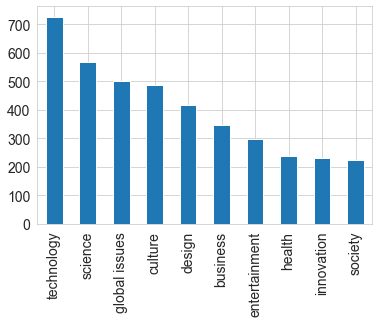

In [33]:
tags_df[tags_df['tags'].isin(tag_list)]['tags'].value_counts().plot(kind = 'bar', fontsize = 14)

In [34]:
#Sample of talks with top tags
tags_df[tags_df['tags'].isin(tag_list)]

,comments,description,duration,event,film_date,languages,main_speaker,name,num_speaker,published_date,ratings,related_talks,speaker_occupation,title,url,views,film_datestamp,published_datestamp,comments_per_10k_views,tags,film_year
0,4553,Sir Ken Robinson makes an entertaining and pro...,1164,TED2006,1140825600,60,Ken Robinson,Ken Robinson: Do schools kill creativity?,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 19645}, {...","[{'id': 865, 'hero': 'https://pe.tedcdn.com/im...",Author/educator,Do schools kill creativity?,https://www.ted.com/talks/ken_robinson_says_sc...,47227110,2006-02-24 18:00:00,2006-06-26 19:11:00,0.964065,culture,2006
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520,2006-02-24 18:00:00,2006-06-26 19:11:00,0.827990,culture,2006
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520,2006-02-24 18:00:00,2006-06-26 19:11:00,0.827990,global issues,2006
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520,2006-02-24 18:00:00,2006-06-26 19:11:00,0.827990,science,2006
1,265,With the same humor and humanity he exuded in ...,977,TED2006,1140825600,43,Al Gore,Al Gore: Averting the climate crisis,1,1151367060,"[{'id': 7, 'name': 'Funny', 'count': 544}, {'i...","[{'id': 243, 'hero': 'https://pe.tedcdn.com/im...",Climate advocate,Averting the climate crisis,https://www.ted.com/talks/al_gore_on_averting_...,3200520,2006-02-24 18:00:00,2006-06-26 19:11:00,0.827990,technology,2006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2546,6,How can you study Mars without a spaceship? He...,290,TED2017,1492992000,3,Armando Azua-Bustos,Armando Azua-Bustos: The most Martian place on...,1,1505919737,"[{'id': 22, 'name': 'Fascinating', 'count': 32...","[{'id': 2491, 'hero': 'https://pe.tedcdn.com/i...",Astrobiologist,The most Martian place on Earth,https://www.ted.com/talks/armando_azua_bustos_...,417470,2017-04-23 19:00:00,2017-09-20 10:02:17,0.143723,science,2017
2547,10,Science fiction visions of the future show us ...,651,TED2017,1492992000,1,Radhika Nagpal,Radhika Nagpal: What intelligent machines can ...,1,1506006095,"[{'id': 1, 'name': 'Beautiful', 'count': 14}, ...","[{'id': 2346, 'hero': 'https://pe.tedcdn.com/i...",Robotics engineer,What intelligent machines can learn from a sch...,https://www.ted.com/talks/radhika_nagpal_what_...,375647,2017-04-23 19:00:00,2017-09-21 10:01:35,0.266207,innovation,2017
2547,10,Science fiction visions of the future show us ...,651,TED2017,1492992000,1,Radhika Nagpal,Radhika Nagpal: What intelligent machines can ...,1,1506006095,"[{'id': 1, 'name': 'Beautiful', 'count': 14}, ...","[{'id': 2346, 'hero': 'https://pe.tedcdn.com/i...",Robotics engineer,What intelligent machines can learn from a sch...,https://www.ted.com/talks/radhika_nagpal_what_...,375647,2017-04-23 19:00:00,2017-09-21 10:01:35,0.266207,science,2017
2549,8,With more than half of the world population li...,519,TED2017,1492992000,1,Karoliina Korppoo,Karoliina Korppoo: How a video game might help...,1,1506092422,"[{'id': 21, 'name': 'Unconvincing', 'count': 2...","[{'id': 2682, 'hero': 'https://pe.tedcdn.com/i...",Game 

#### Top tags count by year

In [35]:
top_tags = tags_df[tags_df['tags'].isin(tag_list)]
pd.crosstab(top_tags['film_year'], top_tags['tags'])

tags,business,culture,design,entertainment,global issues,health,innovation,science,society,technology
film_year,,,,,,,,,,
1983,0,0,0,0,0,0,0,1,0,0
1984,0,0,1,1,0,0,0,0,0,1
1990,0,0,1,0,1,0,0,0,0,1
1991,0,0,0,0,0,0,0,1,0,0
1994,0,0,0,0,0,0,1,1,0,1
1998,0,2,4,1,0,0,0,1,0,5
2001,0,2,1,1,0,0,0,1,1,1
2002,5,9,10,6,4,0,1,9,0,11
2003,5,8,10,7,7,2,1,11,2,13


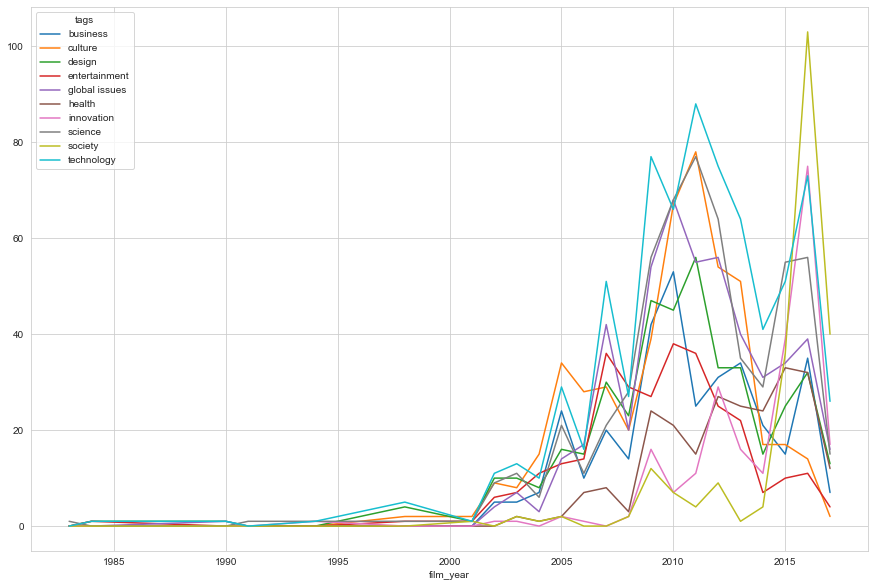

In [36]:
pd.crosstab(top_tags['film_year'], top_tags['tags']).plot(kind = 'line', stacked = False, figsize = (15,10))
plt.show()

TED Talks with the top tags really started to take off around 2001-2002, which is the same time talks started regularly being given.

#### Top tags by proportion of talks

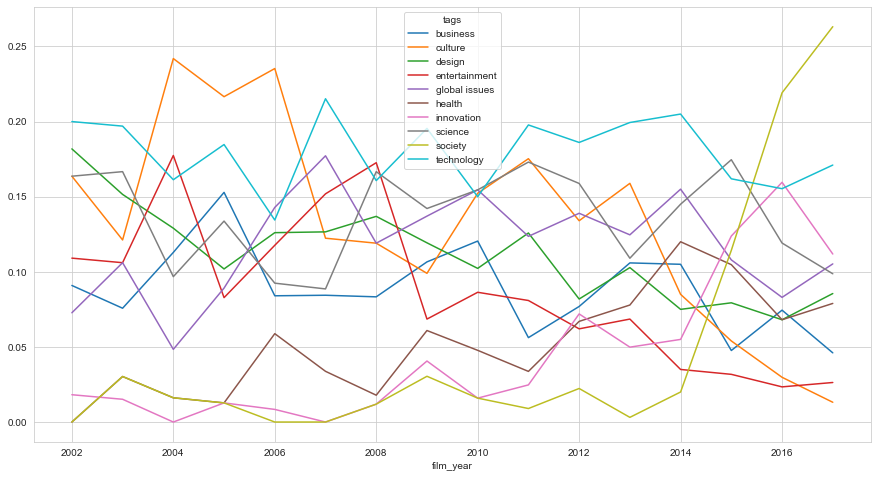

In [37]:
top_tags2001 = top_tags[top_tags['film_year'] > 2001]
top_tags_pct = pd.crosstab(top_tags2001['film_year'], top_tags2001['tags']).apply(lambda x: x/x.sum(), axis=1)
top_tags_pct.plot(kind = 'line', stacked = False, figsize = (15,8))
plt.show()

Early on, "culture" was a popular tag on a large proportion of TED talks, but this tag has been declining in popularity since at least 2013. Meanwhile, starting in 2014, there has been a big spike in the proportion of talks with the tag "society".

# Cluster TED Talks using KMeans

## Import Libraries for Modeling

In [38]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import normalize

## Identify tags to clean

These cells were used to review unique tag values and identify cleaning needs. The longer results have been cleared to save space.

In [ ]:
#All unique tag values
pprint(sorted(tags_df['tags'].str.lower().unique()))

In [ ]:
#Tags with spaces - used primarily to identify place names to be treated as single tokens
pprint(sorted(tags_df[tags_df['tags'].str.find(' ') >= 0]['tags'].str.lower().unique()))

In [41]:
#Tags with TED
pprint(sorted(tags_df[tags_df['tags'].str.lower().str.find('ted') >= 0]['tags'].str.lower().unique()))

['augmented reality',
 'ted books',
 'ted brain trust',
 'ted en español',
 'ted fellows',
 'ted prize',
 'ted residency',
 'ted-ed',
 'tedmed',
 'tednyc',
 'tedx',
 'tedyouth',
 'united states']


## Clean and vectorize tags

Some of the tags reference place names, like "Africa" or "United States". By default, the vectorizer would treat "United" and "States" separately, but I would prefer that "United States" be treated as a single token. Therefore, I am removing spaces from any of the place names I identified in the tags:

- Middle East
- New York
- South America
- United States

Several of the tags reference "TED" (e.g., TEDx, TED Prize, etc.) or awards like the MacArthur Grant or Nobel Prize. I want to remove these as they don't provide much insight into the talk content.

I don't want to remove all tags that contain "ted" because some are more useful (like 'United States' and 'augmented reality').

In [42]:
def clean_tags(tag_list):
    places = ['middle east','new york','south america','united states']
    ted_awards = ['ted books','ted brain trust','ted en español','ted fellows','ted prize','ted residency',\
                  'ted-ed','tedmed','tednyc','tedx','tedyouth','macarthur grant','nobel prize']
    cleaned = []
    for tag in tag_list:
        if tag.lower() in places:
            cleaned.append(tag.replace(' ',''))
        elif tag.lower() in ted_awards:
            continue
        else:
            cleaned.append(tag)
    return cleaned

In [43]:
#Clean all tags
ted_main_df['tags_clean'] = ted_main_df['tags'].apply(clean_tags)

#Verify results
ted_main_df['tags_clean'][2545] #'TED Residency' removed; 'United States' changed to 'UnitedStates'

['UnitedStates',
 'community',
 'family',
 'immigration',
 'journalism',
 'social change',
 'society']

In [44]:
ted_main_df['tags_string'] = ted_main_df['tags_clean'].apply(' '.join)
ted_main_df['tags_string']

0       children creativity culture dance education pa...
1       alternative energy cars climate change culture...
2       computers entertainment interface design media...
3       activism business cities environment green ine...
4       Africa Asia Google demo economics global devel...
                              ...                        
2545    UnitedStates community family immigration jour...
2546    Mars SouthAmerica astrobiology biology explora...
2547    AI ants fish future innovation insects intelli...
2548    Internet UnitedStates community compassion pol...
2549    cities design future infrastructure play publi...
Name: tags_string, Length: 2550, dtype: object

Feed the cleaned tags into the TF/IDF vectorizer.

In [45]:
data = ted_main_df['tags_string']

tf_idf_vectorizor = TfidfVectorizer(
    stop_words = 'english', 
    max_features = 10000
)

tf_idf = tf_idf_vectorizor.fit_transform(data)
tf_idf_norm = normalize(tf_idf)
tf_idf_array = tf_idf_norm.toarray()

Sample the resulting array

In [46]:
tf_idf_df = pd.DataFrame(tf_idf_array, columns=tf_idf_vectorizor.get_feature_names())
tf_idf_df.shape #(2550, 426)
tf_idf_df.head(10)

,3d,activism,addiction,adventure,advertising,africa,aging,agriculture,ai,aids,aircraft,algorithm,alternative,alzheimer,ancient,animals,animation,anthropocene,anthropology,ants,apes,archaeology,architecture,art,asia,asteroid,astrobiology,astronomy,atheism,augmented,autism,bacteria,balance,bang,beauty,bees,behavioral,big,biodiversity,bioethics,biology,biomechanics,biomimicry,biosphere,biotech,birds,blindness,blockchain,blue,body,books,botany,brain,brand,brazil,buddhism,building,bullying,business,cancer,capitalism,care,cars,cello,change,charter,chemistry,children,china,choice,christianity,cities,climate,cloud,code,cognitive,collaboration,comedy,communication,community,compassion,complexity,composing,computers,conducting,consciousness,conservation,consumerism,corruption,cosmos,creativity,crime,criminal,crispr,crowdsourcing,culture,cultures,curiosity,cyborg,dance,dark,data,death,debate,decision,deextinction,demo,democracy,depression,design,development,dinosaurs,disability,disaster,discovery,disease,disorder,dna,driverless,drones,ebola,ecology,economics,education,egypt,empathy,energy,engineering,entertainment,entrepreneur,environment,epidemiology,equality,europe,evil,evolution,evolutionary,exoskeleton,exploration,extraterrestrial,extreme,failure,faith,family,farming,fashion,fear,feminism,film,finance,fish,flight,food,foreign,forensics,friendship,funny,future,gaming,garden,gender,genetics,geology,glacier,global,goal,god,google,government,grammar,green,growth,guitar,guns,hack,happiness,health,hearing,heart,history,hiv,human,humanity,humor,identity,illness,illusion,imaging,immigration,india,industrial,inequality,infrastructure,innovation,insects,intelligence,interface,internet,interview,introvert,invention,investment,iran,iraq,islam,issues,jazz,journalism,justice,language,law,leadership,learning,lgbt,library,life,literature,live,love,machine,magic,making,manufacturing,map,marketing,mars,materials,math,matter,media,medical,medicine,meditation,meme,memory,men,mental,microbes,microbiology,microfinance,microsoft,middleeast,military,mind,mindfulness,mining,mission,mobility,molecular,money,monkeys,moon,morality,motivation,movies,museums,music,nanoscale,narcotics,nasa,natural,nature,neuroscience,news,newyork,nonviolence,novel,nuclear,obesity,oceans,oil,online,open,origami,origins,pain,painting,paleontology,pandemic,parenting,peace,performance,personal,personality,pharmaceuticals,philanthropy,philosophy,photography,physics,physiology,piano,planets,planning,plants,plastic,play,poetry,policy,politics,pollution,population,potential,poverty,prediction,pregnancy,presentation,primates,printing,prison,privacy,problems,product,productivity,programming,prosthetics,protests,psychology,ptsd,public,race,reality,refugees,relationships,relief,religion,research,resources,rivers,robots,rocket,sanitation,science,security,self,senses,setting,sex,sexual,shopping,sight,simplicity,singer,skateboarding,slavery,sleep,smell,social,society,sociology,software,solar,sound,source,southamerica,space,spaces,spectrum,speech,spoken,sports,state,statistics,storytelling,street,string,student,submarine,success,suicide,surgery,surveillance,sustainability,synthetic,syria,teaching,technology,telecom,telescopes,television,terrorism,testing,theater,theory,time,toy,trafficking,transgender,transportation,travel,trees,trust,typography,unitedstates,universe,urban,vaccines,video,violence,violin,virtual,virus,visualizations,vocals,vulnerability,war,water,weapons,weather,web,wikipedia,wind,women,word,work,world,writing,wunderkind,youth
0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.339234,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.3149

## Create and fit KMeans model

In [47]:
kmeans = KMeans (
    init = "random",
    n_clusters = 3,
    n_init = 50,
    max_iter = 300,
    random_state = 42
)

In [48]:
# Fit the model to the vectorized tags
kmeans.fit(tf_idf_array)

KMeans(init='random', n_clusters=3, n_init=50, random_state=42)

In [49]:
# Assign clusters
predictions = kmeans.predict(tf_idf_array)

## View clusters

In [50]:
#import wordcloud library to help visualize cluster contents
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

Identify the top features in each cluster, by TF/IDF score

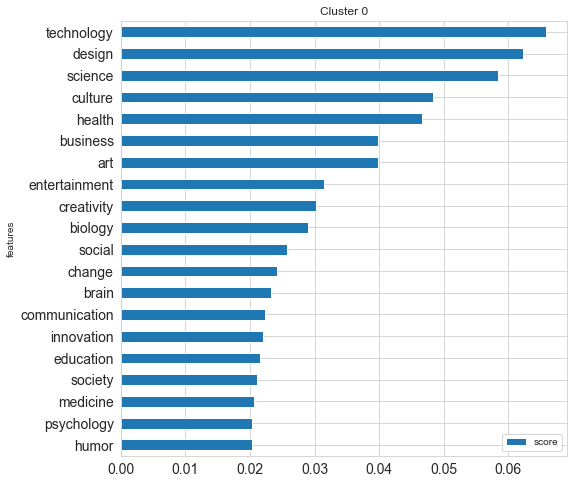

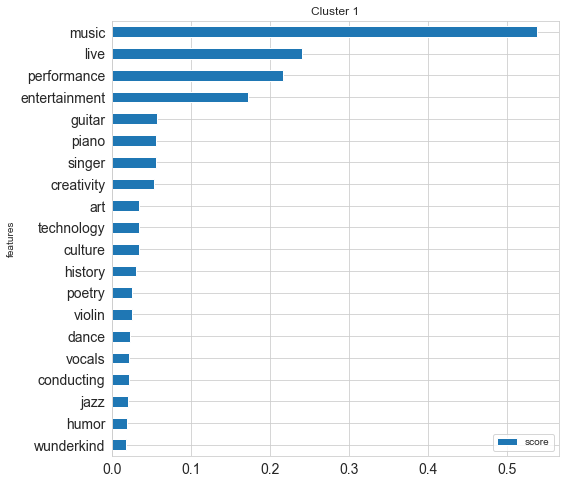

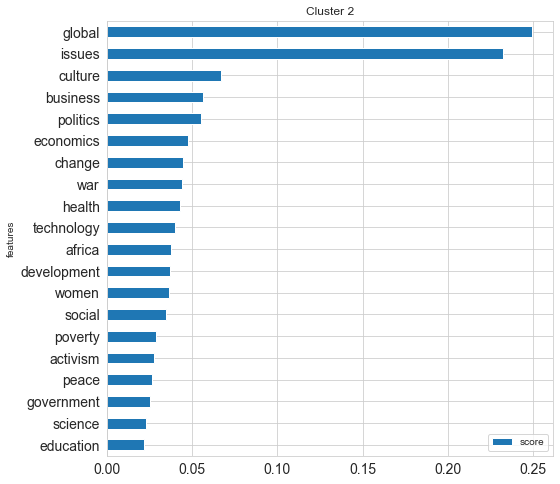

In [51]:
def get_top_n_features_by_cluster(tf_idf_array, prediction, n_feats):
    
    labels = np.unique(prediction)
    dfs = []
    
    for label in labels:
        
        ix_temp = np.where(prediction == label) # indices for each cluster
        x_means = np.mean(tf_idf_array[ix_temp], axis = 0) # returns average score across cluster
        sorted_means = np.argsort(x_means)[::-1][:n_feats] # indices with top 20 scores
        
        features = tf_idf_vectorizor.get_feature_names()
        best_features = [(features[i], x_means[i]) for i in sorted_means]
        df = pd.DataFrame(best_features, columns = ['features', 'score'])
        dfs.append(df)
        
    return dfs


# Plot top features by score
dfs = get_top_n_features_by_cluster(tf_idf_array, predictions, 20)

for ix, df in enumerate(dfs):
    df.sort_values('score').plot(kind = 'barh', x = 'features', y = 'score', fontsize = 14, figsize = (8,8), title = ('Cluster ' + str(ix)))

Condense the information above into wordclouds

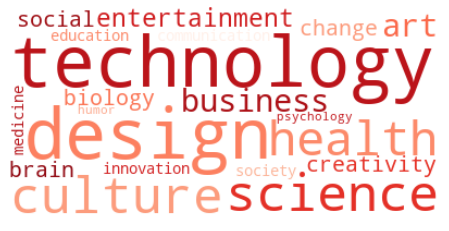

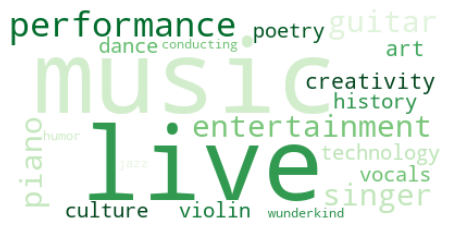

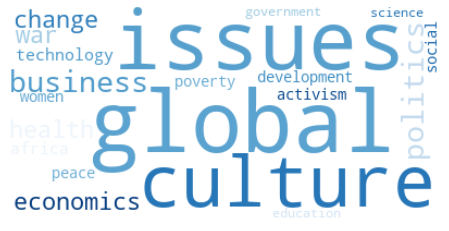

In [52]:
# Create stopword list:
stopwords = set(STOPWORDS)
cmaps = ['Reds','Greens','Blues']

for ix, df in enumerate(dfs):
    text = " ".join(desc for desc in df.features)

    # Generate a word cloud image
    wordcloud = WordCloud(stopwords=stopwords, background_color="white", max_words = 200, colormap = cmaps[ix]).generate(text)

    # Display the generated image:
    # the matplotlib way:
    plt.figure(figsize = (8,4))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

At a glance, it looks like the 3 clusters selected by the algorithm can be summarized as:
- Science and technology
- Global and cultural socioeconomic issues
- Arts and entertainment

Use silhouette score to evaluate the model

In [53]:
sil_score = silhouette_score(tf_idf_array, kmeans.labels_, metric='euclidean')
print('Silhouette Score: %.3f' % sil_score)

Silhouette Score: 0.027


Silhouette scores range from -1 to 1. Scores near +/- 1 indicate well-separated clusters. Scores near zero, like this one, mean the clusters have a lot of overlap.

## Define reusable functions to plot features and word clouds

In [54]:
def plot_barh_top_features(dfs):
    """Plot a fixed number of features for each cluster in a horizontal bar chart"""
    for ix, df in enumerate(dfs):
        df.sort_values('score').plot(
            kind = 'barh', 
            x = 'features', 
            y = 'score', 
            fontsize = 14, 
            figsize = (10,len(df) / 2), 
            title = ('Cluster ' + str(ix))
        )


def plot_barh_top_n_pct_features(dfs, pct):
    """Plot a dynamic number of features for each cluster, 
        based on how many have a score within n pct of the top-scoring feature
        (e.g., if the top feature has a score of 0.1 and the pct = 0.3, 
        the function will plot all the features with a score of 0.07 or higher:
        0.07 = 0.1 - 0.3(0.1)  
    """
    for ix, df in enumerate(dfs):
        pct_min_score = df['score'].max() * (1 - pct)
        df[df['score'] >= pct_min_score].sort_values('score').plot(
            kind = 'barh', 
            x = 'features', 
            y = 'score', 
            fontsize = 14, 
            figsize = (4,len(df[df['score'] >= pct_min_score]) / 2), 
            title = ('Cluster ' + str(ix))
        )

In [55]:
def plot_wordcloud(dfs,bg_color):
    """Generate and display a word cloud of the features in each cluster,
        with colors rotating through a list of pre-defined palettes
    """
    cmaps = ['Reds','Greens','Blues','Oranges','Purples']

    for ix, df in enumerate(dfs):
        text = " ".join(desc for desc in df.features)

        # Generate a word cloud image
        wordcloud = WordCloud(
            stopwords=stopwords, 
            background_color = bg_color, 
            max_words = 200, 
            colormap = cmaps[ix % len(cmaps)]
        ).generate(text)

        # Display the generated image:
        plt.figure(figsize = (8,4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
        
        
def build_wordcloud_list(dfs, bg_color):
    """Generate a word cloud image for each dataframe and store in a list"""
    cmaps = ['Reds','Greens','Blues','Oranges','Purples']
    cloud_list = []

    for ix, df in enumerate(dfs):
        text = " ".join(desc for desc in df.features)

        # Generate a word cloud image
        wordcloud = WordCloud(
            stopwords = stopwords, 
            background_color = bg_color, 
            max_words = 200, 
            colormap = cmaps[ix % len(cmaps)]
        ).generate(text)  
        
        cloud_list.append(wordcloud)
        
    return cloud_list


def show_images(images, rows = 1, titles = None, sort = 0, save_as = ''):
    """Display a list of images in a single figure with matplotlib.
    
    Parameters
    ---------
    images: List of np.arrays compatible with plt.imshow.
    
    rows (Default = 1): Number of rows in figure (number of cols is 
                        set to np.ceil(n_images/float(rows))).
    
    titles: List of titles corresponding to each image. Must have
            the same length as titles.
            
    sort: 1 to sort alphabetically by title, 0 to keep ordered as passed in
    
    save_as: Filename to save the final image, if provided
    """
    assert((titles is None)or (len(images) == len(titles)))
    
    n_images = len(images)
    
    if titles is None: 
        titles = ['Cluster %d' % i for i in range(0,n_images)]
        
    fig = plt.figure(figsize = (10,3))

    image_list = list(zip(titles, images))
    
    if sort == 1:
        image_list.sort()
    
    for n, (title, image) in enumerate(image_list):
        ax = fig.add_subplot(rows, int(np.ceil(n_images/float(rows))), n + 1)
        plt.imshow(image, interpolation = 'bilinear')
        plt.axis("off")
        ax.set_title(title, fontsize = 7 * n_images)
        
    fig.set_size_inches(np.array(fig.get_size_inches()) * n_images)
    plt.tight_layout()

    if save_as != '':
        plt.savefig(save_as)
    
    plt.show()

## Explore other hyperparameters

Increase number of clusters to 4

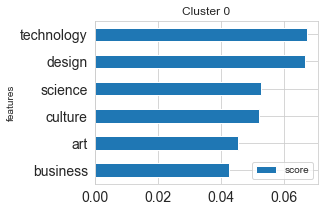

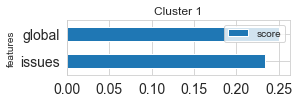

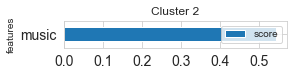

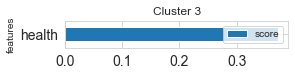

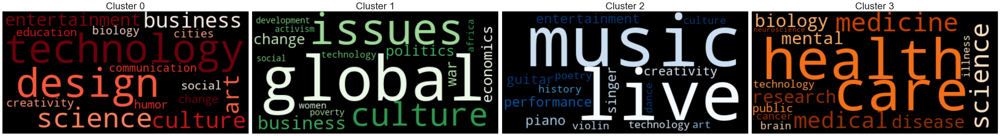

In [56]:
# Instantiate model
kmeans = KMeans(
    init = "random",
    n_clusters = 4,
    n_init = 50,
    max_iter = 300,
    random_state = 42
)

# Fit to data and predict cluster assignments
kmeans.fit(tf_idf_array)
predictions = kmeans.predict(tf_idf_array)

# Identify and plot top features for each cluster
dfs = get_top_n_features_by_cluster(tf_idf_array, predictions, 15)
plot_barh_top_n_pct_features(dfs, 0.4)
clouds = build_wordcloud_list(dfs,'black')
show_images(clouds)

#To save images:
#show_images(clouds, save_as = 'KMeans_4.png')

Adding one more cluster seems to have split the technology and science cluster into two:
- Medical sciences
- More general TED talk themes, like technology, education, communication, etc.

In [57]:
sil_score = silhouette_score(tf_idf_array, kmeans.labels_, metric = 'euclidean')
print('Silhouette Score: %.3f' % sil_score)

Silhouette Score: 0.032


The score is still very close to zero, but adding a 4th cluster has improved it a little bit.

What about increasing the number of clusters to 12?

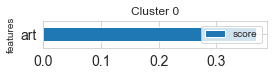

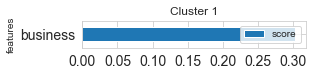

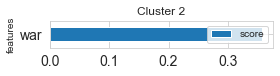

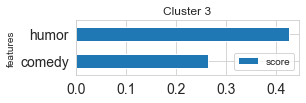

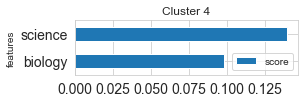

...

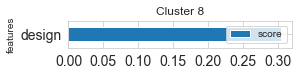

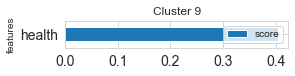

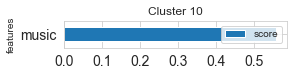

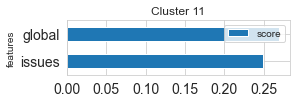

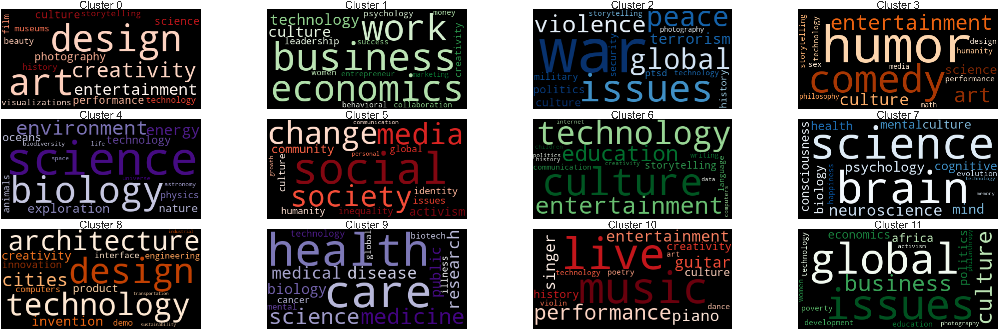

In [58]:
# Instantiate model
kmeans = KMeans(
    init = "random",
    n_clusters = 12,
    n_init = 50,
    max_iter = 300,
    random_state = 42
)

# Fit to data and predict cluster assignments
kmeans.fit(tf_idf_array)
predictions = kmeans.predict(tf_idf_array)

# Identify and plot top features for each cluster
dfs = get_top_n_features_by_cluster(tf_idf_array, predictions, 15)
plot_barh_top_n_pct_features(dfs, 0.4)
clouds = build_wordcloud_list(dfs,'black')
show_images(clouds, 3)

#To save images:
#show_images(clouds, 3, save_as = 'KMeans_12.png')

Adding more clusters has further specialized the topics in each cluster.

- General TED topics:
    - animals and nature
    - urban design
    - business and economics


- Global and Cultural Socioeconomic issues:
    - social activism
    - green energy and sustainability
    - global issues


- Arts and Entertainment:
    - music
    - language arts
    - art and design


- Science and Technology:
    - physical sciences and computers
    - health care/medicine
    - psychology and neuroscience

In [59]:
sil_score = silhouette_score(tf_idf_array, kmeans.labels_, metric = 'euclidean')
print('Silhouette Score: %.3f' % sil_score)

Silhouette Score: 0.047


Increasing the number of clusters from 4 to 12 had another marginal improvement in silhouette score.

This seems logical - increasing the number of clusters should reduce the inter- and intra-cluster distance for each cluster. But there is still a lot of overlap, even with 12 clusters.

## Calculate ideal number of clusters

#### Attempt to locate the "elbow"

Build multiple KMeans models, increasing the number of clusters from 1 to 20.

Plot the scores for each model to identify the "elbow".

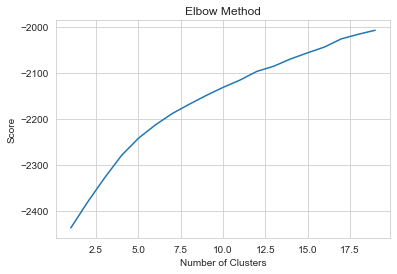

In [60]:
number_clusters = range(1, 20)

kmeans = [KMeans(n_clusters=i, n_init = 50, max_iter = 600, random_state = 42) for i in number_clusters]
kmeans

score = [kmeans[i].fit(tf_idf_array).score(tf_idf_array) for i in range(len(kmeans))]
score

plt.plot(number_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Method')
plt.show()

No "elbow" is clearly identifiable from simple visual inspection.

It looks like it could be somewhere between 4 and 7, or possibly as far out as 17.

Let's try again using the kneed library's KneeLocator to calculate the "elbow" point.

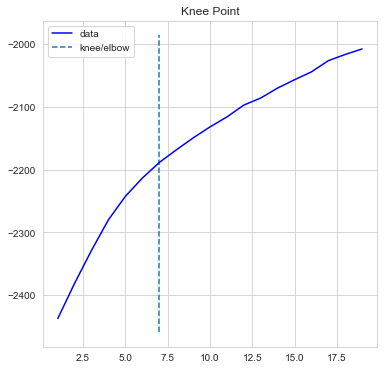

In [61]:
knee_loc = KneeLocator(number_clusters, score, S = 1.0, curve = 'concave', direction = 'increasing')
knee_loc.plot_knee()

Based on this, the "elbow" appears to be at 7 clusters.

#### Re-run the model with 7 clusters.

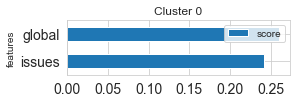

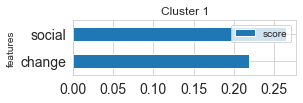

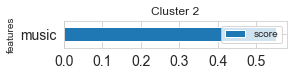

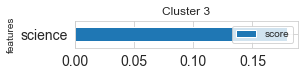

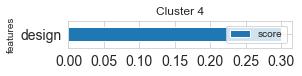

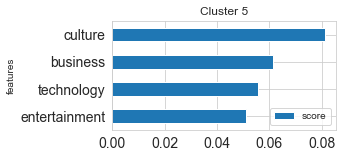

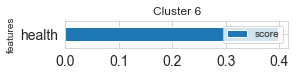

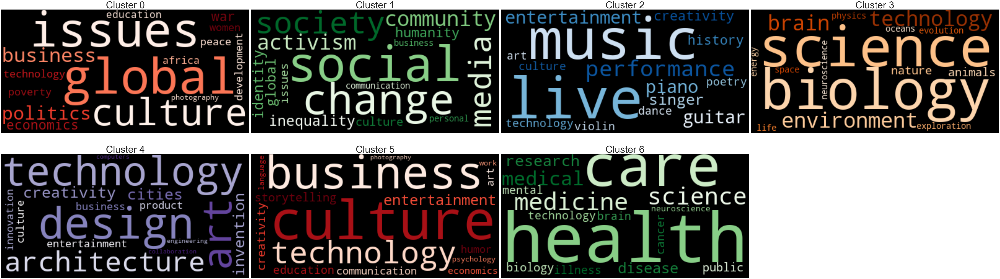

In [62]:
# Instantiate model
kmeans = KMeans(
    init = "random",
    n_clusters = 7,
    n_init = 50,
    max_iter = 600,
    random_state = 42
)

# Fit to data and predict cluster assignments
kmeans.fit(tf_idf_array)
predictions = kmeans.predict(tf_idf_array)

# Identify and plot top features for each cluster
dfs = get_top_n_features_by_cluster(tf_idf_array, predictions, 15)
plot_barh_top_n_pct_features(dfs, 0.4)
clouds = build_wordcloud_list(dfs,'black')
show_images(clouds, 2)

#To save images:
#show_images(clouds, 2, save_as = 'KMeans_7.png')

Based on the "elbow" method, the optimal set of clusters is:
- global/cultural socioeconomic issues
- social activism

- music and performance art

- invention and innovation (general TED topics)
- business and communication (general TED topics)

- health and medicine
- science and nature

## Score the model

Calculate the silhouette score

In [63]:
sil_score = silhouette_score(tf_idf_array, kmeans.labels_, metric = 'euclidean')
print('Silhouette Score: %.3f' % sil_score)

Silhouette Score: 0.041


This score is only slightly lower than we had for 12 clusters. It seems to do almost as well at dividing up the talks, but uses 5 fewer clusters.

## Effect of increasing the number of clusters

Finally, let's see how the models subdivide the TED Talk topics as the number of clusters is increased from 3 to the "elbow point" of 7.

3 Clusters; Silhouette Score: 0.027


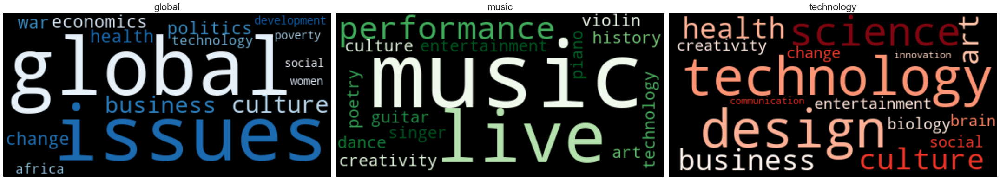

4 Clusters; Silhouette Score: 0.032


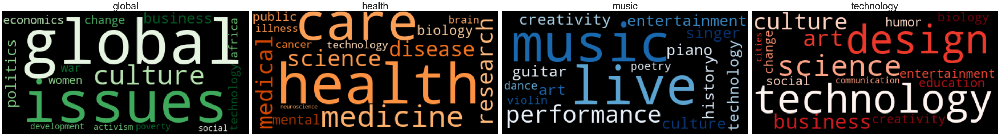

5 Clusters; Silhouette Score: 0.037


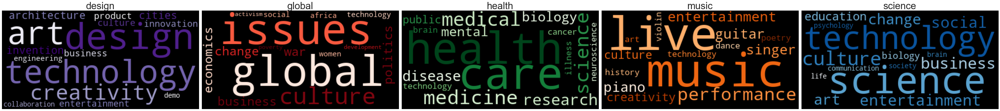

6 Clusters; Silhouette Score: 0.040


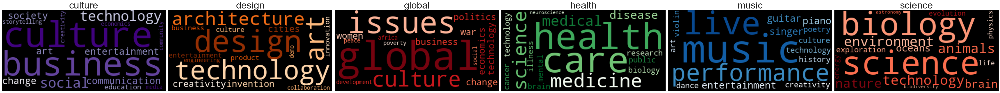

7 Clusters; Silhouette Score: 0.041


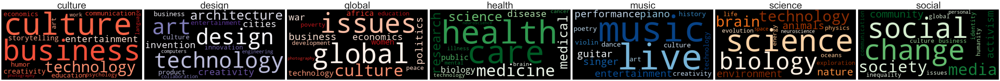

In [64]:
for n in range(3,8):

    # Instantiate model
    kmeans = KMeans(
        init = "random",
        n_clusters = n,
        n_init = 50,
        max_iter = 300,
        random_state = 42
    )

    # Fit to data, predict cluster assignments and score model
    kmeans.fit(tf_idf_array)
    predictions = kmeans.predict(tf_idf_array)
    sil_score = silhouette_score(tf_idf_array, kmeans.labels_, metric='euclidean')

    print(f'{n} Clusters; Silhouette Score: {sil_score:.3f}')

    # Identify and plot top features for each cluster
    dfs = get_top_n_features_by_cluster(tf_idf_array, predictions, 15)
    
    # Assign top feature in each cluster as the title
    titles = []
    for df in dfs:
        titles.append(df.sort_values('score', ascending = False).iloc[0,0])

    clouds = build_wordcloud_list(dfs,'black')
    show_images(clouds, 1, titles, sort = 1)